In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set()

%config InlineBackend.figure_format = 'svg'

In [2]:
df = pd.read_csv('data/Seasons_Stats.csv', index_col=0)
df.head()

,Year,Player,Pos,Age,Tm,G,GS,MP,PER,TS%,...,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS
0,1950.0,Curly Armstrong,G-F,31.0,FTW,63.0,NaN,NaN,NaN,0.368,...,0.705,NaN,NaN,NaN,176.0,NaN,NaN,NaN,217.0,458.0
1,1950.0,Cliff Barker,SG,29.0,INO,49.0,NaN,NaN,NaN,0.435,...,0.708,NaN,NaN,NaN,109.0,NaN,NaN,NaN,99.0,279.0
2,1950.0,Leo Barnhorst,SF,25.0,CHS,67.0,NaN,NaN,NaN,0.394,...,0.698,NaN,NaN,NaN,140.0,NaN,NaN,NaN,192.0,438.0
3,1950.0,Ed Bartels,F,24.0,TOT,15.0,NaN,NaN,NaN,0.312,...,0.559,NaN,NaN,NaN,20.0,NaN,NaN,NaN,29.0,63.0
4,1950.0,Ed Bartels,F,24.0,DNN,13.0,NaN,NaN,NaN,0.308,...,0.548,NaN,NaN,NaN,20.0,NaN,NaN,NaN,27.0,59.0


In [3]:
df.columns

Index(['Year', 'Player', 'Pos', 'Age', 'Tm', 'G', 'GS', 'MP', 'PER', 'TS%',
       '3PAr', 'FTr', 'ORB%', 'DRB%', 'TRB%', 'AST%', 'STL%', 'BLK%', 'TOV%',
       'USG%', 'blanl', 'OWS', 'DWS', 'WS', 'WS/48', 'blank2', 'OBPM', 'DBPM',
       'BPM', 'VORP', 'FG', 'FGA', 'FG%', '3P', '3PA', '3P%', '2P', '2PA',
       '2P%', 'eFG%', 'FT', 'FTA', 'FT%', 'ORB', 'DRB', 'TRB', 'AST', 'STL',
       'BLK', 'TOV', 'PF', 'PTS'],
      dtype='object')

In [4]:
df.shape

(24691, 52)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 24691 entries, 0 to 24690
Data columns (total 52 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Year    24624 non-null  float64
 1   Player  24624 non-null  object 
 2   Pos     24624 non-null  object 
 3   Age     24616 non-null  float64
 4   Tm      24624 non-null  object 
 5   G       24624 non-null  float64
 6   GS      18233 non-null  float64
 7   MP      24138 non-null  float64
 8   PER     24101 non-null  float64
 9   TS%     24538 non-null  float64
 10  3PAr    18839 non-null  float64
 11  FTr     24525 non-null  float64
 12  ORB%    20792 non-null  float64
 13  DRB%    20792 non-null  float64
 14  TRB%    21571 non-null  float64
 15  AST%    22555 non-null  float64
 16  STL%    20792 non-null  float64
 17  BLK%    20792 non-null  float64
 18  TOV%    19582 non-null  float64
 19  USG%    19640 non-null  float64
 20  blanl   0 non-null      float64
 21  OWS     24585 non-null  float64
 22  DWS

In [6]:
'''
1976 is the year of NBA and ABA merger. Generally stats became much better.
'''
df = df[df['Year'] > 1976]
df['Year'] = df['Year'].dropna().astype('int64')

'''
Drop empty columns
'''
df = df.drop(['blanl', 'blank2'], axis=1)

'''
Drop players with few games played to avoid noise.
'''
df = df[df['G'] > 20]

In [7]:
"Per game averages for points, rebounds, assists, steals, blocks"
df['PPG'] = (df['PTS'] / df['G']).round(1)
df['RPG'] = (df['TRB'] / df['G']).round(1)
df['APG'] = (df['AST'] / df['G']).round(1)
df['SPG'] = (df['STL'] / df['G']).round(1)
df['BPG'] = (df['BLK'] / df['G']).round(1)
df.head()

,Year,Player,Pos,Age,Tm,G,GS,MP,PER,TS%,...,STL,BLK,TOV,PF,PTS,PPG,RPG,APG,SPG,BPG
4649,1977,Zaid Abdul-Aziz,C,30.0,BUF,22.0,NaN,195.0,16.3,0.447,...,3.0,9.0,NaN,21.0,83.0,3.8,4.1,0.3,0.1,0.4
4650,1977,Kareem Abdul-Jabbar*,C,29.0,LAL,82.0,NaN,3016.0,27.8,0.608,...,101.0,261.0,NaN,262.0,2152.0,26.2,13.3,3.9,1.2,3.2
4651,1977,Tom Abernethy,SF,22.0,LAL,70.0,NaN,1378.0,12.7,0.538,...,49.0,10.0,NaN,118.0,439.0,6.3,4.2,1.4,0.7,0.1
4652,1977,Alvan Adams,C,22.0,PHO,72.0,NaN,2278.0,20.2,0.519,...,95.0,87.0,NaN,260.0,1296.0,18.0,9.1,4.5,1.3,1.2
4653,1977,Don Adams,SF,29.0,BUF,77.0,NaN,1710.0,11.7,0.466,...,74.0,16.0,NaN,201.0,561.0,7.3,4.8,1.9,1.0,0.2


In [8]:
'''
TS% average by year
'''
TS_mean_year = df.groupby('Year')['TS%'].mean()

'''
rTS% expresses how much more efficient a given player is compared to league average
if rTS% is positive then player is better
'''
df = pd.merge(df, TS_mean_year, on='Year', how='inner').rename(columns={'TS%_x' : 'TS%', 'TS%_y': 'League Average TS%'})

df['rTS%'] = (df['TS%'] / df['League Average TS%'] - 1)
df = df.round(2)

df = df.drop(['League Average TS%'], axis=1)

In [9]:
df.reset_index(drop=True, inplace=True)

In [10]:
df.select_dtypes(include=np.number).loc[:, 'TS%':].describe()

,TS%,3PAr,FTr,ORB%,DRB%,TRB%,AST%,STL%,BLK%,TOV%,...,BLK,TOV,PF,PTS,PPG,RPG,APG,SPG,BPG,rTS%
count,16029.000000,15111.000000,16029.000000,16029.000000,16029.000000,16029.000000,16029.000000,16029.000000,16029.000000,15719.000000,...,16029.000000,15719.000000,16029.000000,16029.000000,16029.000000,16029.000000,16029.000000,16029.000000,16029.000000,16029.000000
mean,0.518408,0.159216,0.311328,6.065799,13.839453,9.949772,13.592950,1.660846,1.449922,14.597105,...,29.960384,90.618233,134.186724,604.985901,9.287891,3.936677,2.116470,0.750615,0.461501,-0.000041
std,0.054125,0.182312,0.145306,3.783138,5.773408,4.451154,9.047731,0.697554,1.473382,4.389581,...,39.059507,65.725279,73.407372,474.239553,5.889847,2.561669,1.898719,0.474871,0.534578,0.102650
min,0.220000,0.000000,0.000000,0.000000,1.600000,1.700000,0.000000,0.000000,0.000000,1.400000,...,0.000000,1.000000,4.000000,6.000000,0.200000,0.100000,0.000000,0.000000,0.000000,-0.580000
25%,0.490000,0.010000,0.210000,2.700000,9.100000,6.100000,6.900000,1.200000,0.400000,11.500000,...,6.000000,39.000000,73.000000,224.000000,4.600000,2.000000,0.800000,0.400000,0.100000,-0.060000
50%,0.520000,0.070000,0.290000,5.400000,12.900000,9.200000,10.800000,1.600000,0.900000,14.000000,...,16.000000,75.000000,128.000000,482.000000,7.900000,3.300000,1.500000,0.700000,0.300000,0.010000
75%,0.550000,0.290000,0.390000,8.900000,18.100000,13.400000,18.300000,2.100000,1.900000,17.100000,...,37.000000,129.000000,188.000000,869.000000,12.800000,5.200000,2.800000,1.000000,0.600000,0.070000
max,0.760000,0.940000,1.580000,23.400000,38.000000,29.700000,57.500000,5.900000,10.800000,57.100000,...,456.000000,464.000000,386.000000,3041.000000,37.100000,18.700000,14.500000,3.700000,5.600000,0.460000


<Axes: xlabel='FG%', ylabel='Count'>

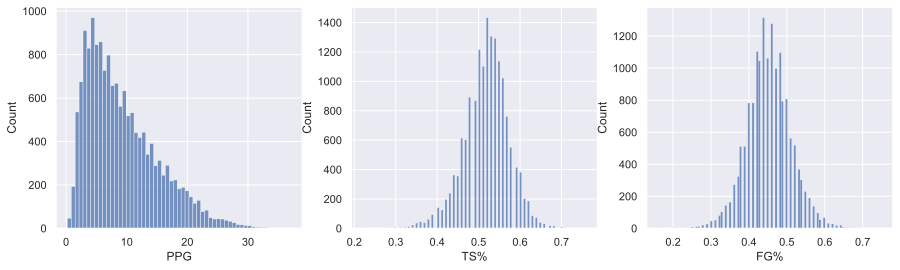

In [11]:
_, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 4))

sns.histplot(x='PPG', data=df, ax=axes[0])
sns.histplot(x='TS%', data=df, ax=axes[1])
sns.histplot(x='FG%', data=df, ax=axes[2])

'\nHere we can see correlation between FG%(how much of his shots a player made) and PPG(how much he scored on average).\nThat makes sense, the more percent of your shots you make the more you score.\n'

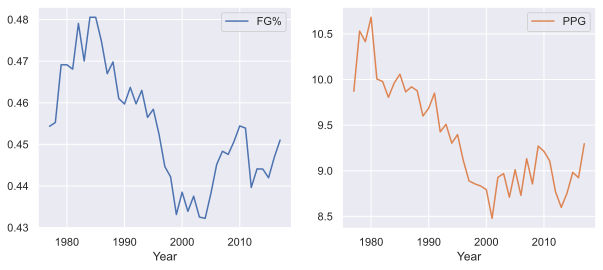

In [12]:
(
    df[['FG%', 'PPG', 'Year']]
        .groupby('Year')
        .mean()
        .plot(
            layout=(1,2),
            subplots=True, 
            sharex=False,
            figsize=(10,4)
        )
)
'''
Here we can see correlation between FG%(how much of his shots a player made) and PPG(how much he scored on average).
That makes sense, the more percent of your shots you make the more you score.
'''

'Three point revolution'

"\nOn these 3 plots so called '3 point evolution', nba teams started shooting more 3 point shots.\n"

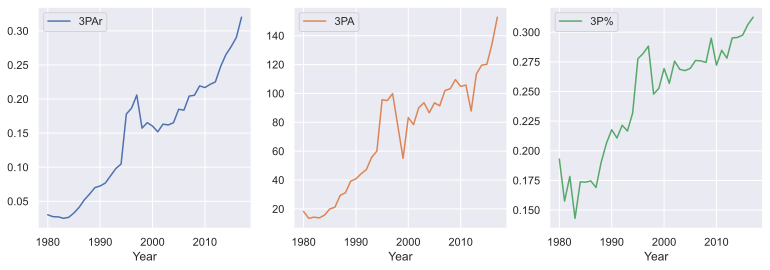

In [13]:
three_point_cols = ['3PAr', '3PA', '3P%']
two_point_cols = ['2PA', '2P%']

axes = (
    df[three_point_cols + ['Year']]
    .groupby('Year')
    .mean()
    .plot(
        layout=(1, 3), 
        subplots=True, 
        sharex=False, 
        figsize=(13, 4)
    )
)

'''
On these 3 plots so called '3 point evolution', nba teams started shooting more 3 point shots.
'''

'\nAt the same time, as 3 point attempts increased, players started taking less 2-point attempts.\n'

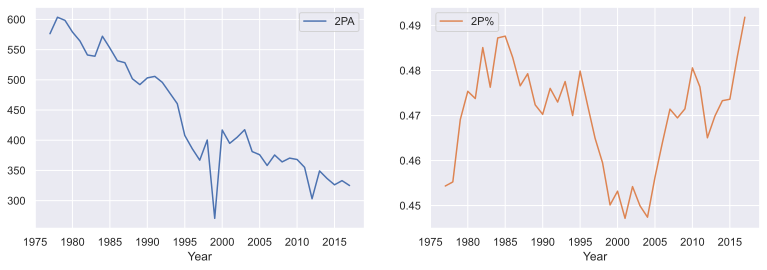

In [14]:
(
    df[two_point_cols + ['Year']]
    .groupby('Year')
    .mean()
    .plot(
        layout = (1, 2), 
        subplots = True, 
        sharex = False,
        figsize = (13 ,4)
    )
)

'''
At the same time, as 3 point attempts increased, players started taking less 2-point attempts.
'''

'\nPlayers started shooting the ball from further away from the basket, thus stretching defensive players, thus decreasing free-throw attempts.\n'

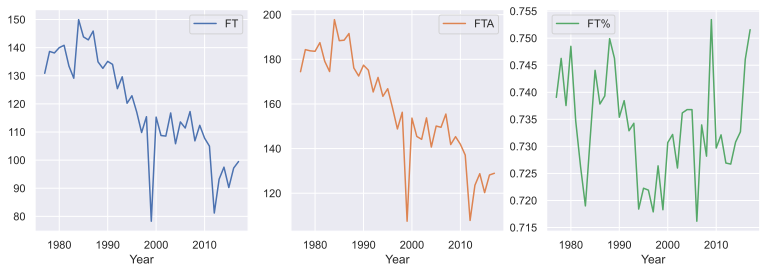

In [15]:
freethrow_cols = ['FT', 'FTA', 'FT%']

(
    df[freethrow_cols + ['Year']]
    .groupby('Year')
    .mean()
    .plot(
        layout = (1, 3), 
        subplots = True, 
        sharex = False, 
        figsize = (13, 4)
    )
)
'''
Players started shooting the ball from further away from the basket, thus stretching defensive players, \
thus decreasing free-throw attempts.
'''

"\nPlayer effectiveness dipped in 2000-s in so called 'Dead ball era'.\n"

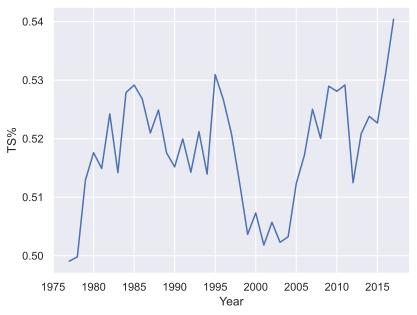

In [16]:
(
    df.groupby('Year')['TS%']
    .mean()
    .plot(
        ylabel='TS%',
    )
)

'''
Player effectiveness dipped in 2000-s in so called 'Dead ball era'.
'''

<Axes: xlabel='rTS%', ylabel='Density'>

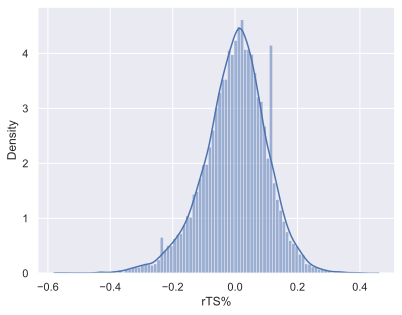

In [17]:
sns.histplot(x='rTS%', data=df, kde=True, stat='density')

In [18]:
sns.scatterplot(data=df, x='FG%', y='PPG', alpha=0.6)
plt.title('Distribution of FG% across PPG')

'''

'''

'\n\n'

In [19]:
sns.scatterplot(data=df, x='TS%', y='PPG', alpha=0.6)

<Axes: xlabel='TS%', ylabel='PPG'>

In [20]:
#Do high volume scorers sacrifice efficiency ?
sns.jointplot(x='USG%', y='FG%', data=df)
sns.jointplot(x='USG%', y='FG%', data=df)

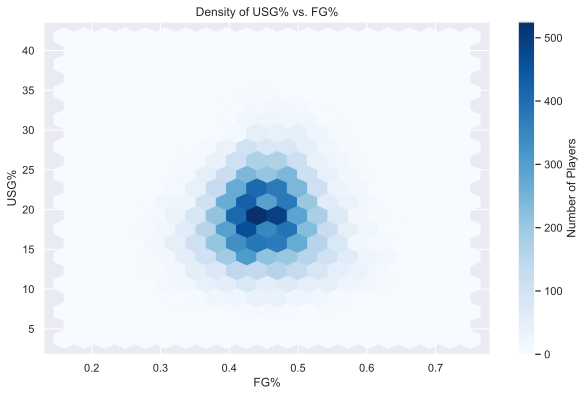

In [21]:
plt.figure(figsize=(10, 6))
plt.hexbin(df['FG%'], df['USG%'], gridsize=20, cmap='Blues')
plt.colorbar(label='Number of Players')
plt.title("Density of USG% vs. FG%")
plt.xlabel("FG%")
plt.ylabel("USG%")
plt.show()

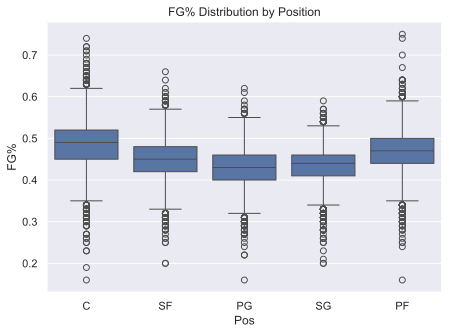

In [23]:
positions = ['PG', 'SG', 'SF', 'PF', 'C']

sns.boxplot(data=df[df['Pos'].isin(positions)], x='Pos', y='FG%')
plt.title("FG% Distribution by Position")
plt.tight_layout()
plt.show()

<Axes: xlabel='Year'>

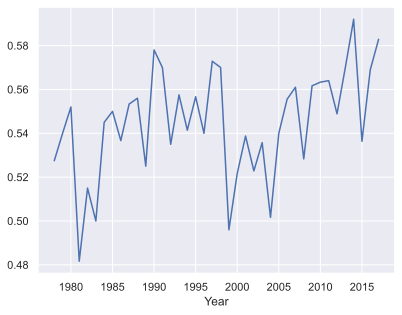

In [24]:
high_usage = df['USG%'] > 30

df[high_usage].groupby('Year')['TS%'].mean().plot()

<Axes: xlabel='USG%', ylabel='TS%'>

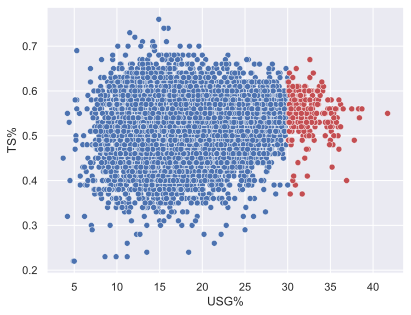

In [25]:
sns.scatterplot(data=df, x='USG%', y='TS%')
sns.scatterplot(data=df[high_usage], x='USG%', y='TS%', c='r')

<Axes: xlabel='Pos', ylabel='BLK%'>

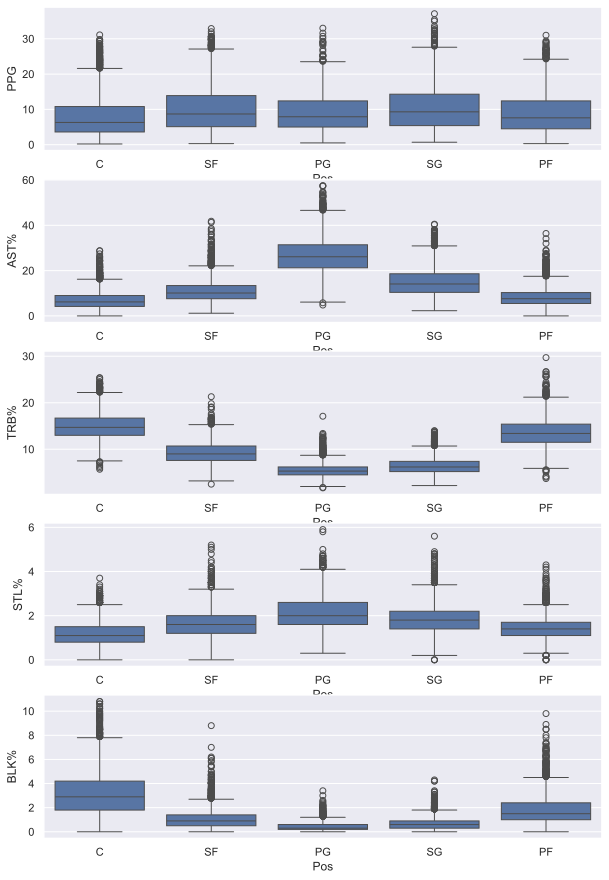

In [37]:
positions = ['PG', 'SG', 'SF', 'PF', 'C']

_, ax = plt.subplots(nrows = 5, ncols = 1, figsize=(10, 15))

sns.boxplot(
    data=df[df['Pos'].isin(positions)], 
    x='Pos', y='PPG', 
    ax=ax[0]
)

sns.boxplot(
    data=df[df['Pos'].isin(positions)], 
    x='Pos', y='AST%', 
    ax=ax[1]
)

sns.boxplot(
    data=df[df['Pos'].isin(positions)], 
    x='Pos', y='TRB%', 
    ax=ax[2]
)

sns.boxplot(
    data=df[df['Pos'].isin(positions)], 
    x='Pos', y='STL%',
    ax=ax[3]
)

sns.boxplot(
    data = df[df['Pos'].isin(positions)],
    x = 'Pos', y = 'BLK%',
    ax=ax[4]
)

## Observations:
* There is no clear-cut leader in points by positions
* Point guards contribute the most to steals and assists
* Centers and power forwards block the most shots and rebound the most.
